In [1]:
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import cv2
from tqdm import tqdm

from src.image_diagnostics import *

In [2]:
DATA_DIR = Path('../../../../data/Streamflow/fpe_stations')
stations = sorted([f.stem for f in DATA_DIR.iterdir() if f.stem not in ['FOXRC', 'GREENR', 'LANESV', 'WESTKILL', 'VLYB']])


In [3]:
def open_and_resize_image(image_path):
    image = cv2.imread(str(image_path))
    image = standardize_image_array(image, is_bgr=True) # opencv reads images in BGR format
    image = image[int(image.shape[0] * 0.05):int(image.shape[0] * 0.85), :, :] # leave out the bottom 15% and top 5% of the image
    aspect_ratio = image.shape[1] / image.shape[0]
    new_width = 512
    new_height = int(new_width / aspect_ratio)
    image_small = cv2.resize(image, (new_width, new_height))
    return image_small

In [4]:
station = stations[0]
station_images = pd.read_csv(DATA_DIR / station / 'FLOW_CFS' / 'images.csv')
print(f'Station: {station} ({len(station_images)} images)')

Station: Avery Brook_Bridge_01171000 (73876 images)


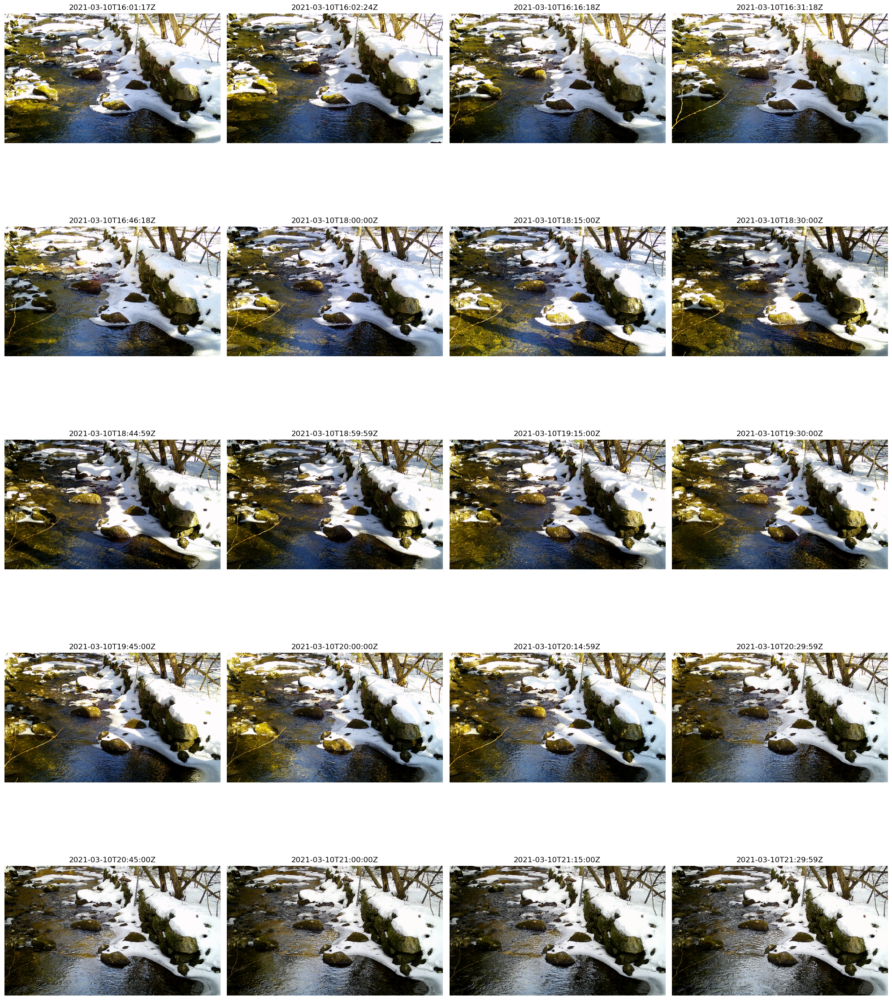

In [8]:
# take the first 20 images
station_images_subset = station_images.iloc[:20]

# plot the images
fig, axs = plt.subplots(5, 4, figsize=(20, 25))
for i, (_, row) in enumerate(station_images_subset.iterrows()):
    image_path = DATA_DIR / station / 'FLOW_CFS' / row['filename']
    image = open_and_resize_image(image_path)
    axs[i // 4, i % 4].imshow(image)
    axs[i // 4, i % 4].set_title(row['timestamp'])
    axs[i // 4, i % 4].axis('off')
plt.tight_layout()
plt.show()

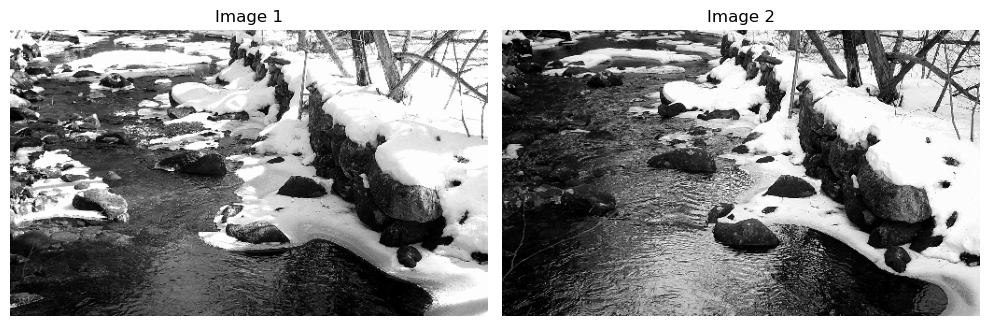

In [22]:
# perform registration between image 1 and image 2
image1_path = DATA_DIR / station / 'FLOW_CFS' / station_images_subset.iloc[0]['filename']
image2_path = DATA_DIR / station / 'FLOW_CFS' / station_images_subset.iloc[19]['filename']
image1 = open_and_resize_image(image1_path)
image2 = open_and_resize_image(image2_path)
image1_gray = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
image2_gray = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)
# plot the images
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(image1_gray, cmap='gray')
axs[0].set_title('Image 1')
axs[0].axis('off')
axs[1].imshow(image2_gray, cmap='gray')
axs[1].set_title('Image 2')
axs[1].axis('off')
plt.tight_layout()
plt.show()

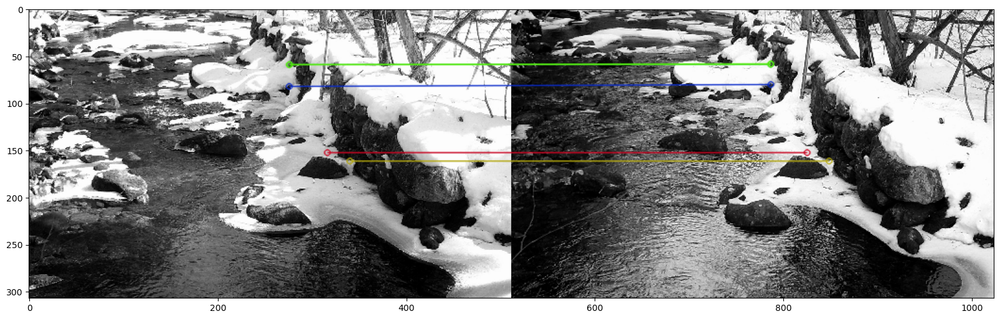

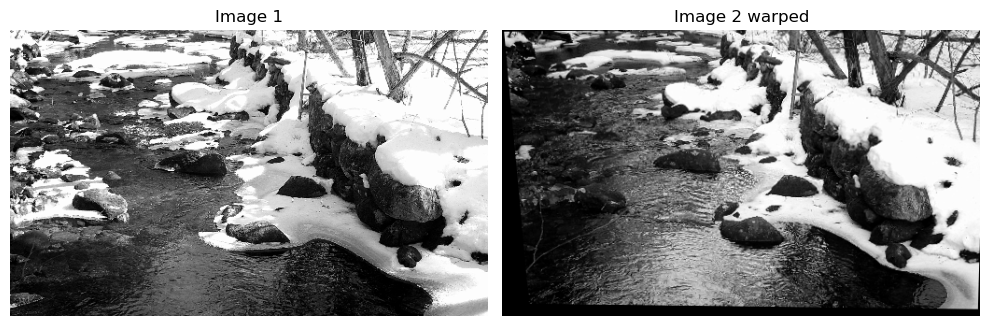

In [23]:
img1 = image1_gray  # queryImage
img2 = image2_gray  # trainImage

# Initiate ORB detector
orb = cv2.ORB_create()

# Find the keypoints and descriptors with ORB
kp1, des1 = orb.detectAndCompute(img1, None)
kp2, des2 = orb.detectAndCompute(img2, None)

# Create BFMatcher object
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)

# Match descriptors
matches = bf.match(des1, des2)

# Sort them in the order of their distance
matches = sorted(matches, key=lambda x: x.distance)

# Draw the matches
img3 = cv2.drawMatches(img1, kp1, img2, kp2, matches[:5], None, flags=2)
plt.figure(figsize=(20,10))
plt.imshow(img3)
plt.show()

# Compute Homography
src_pts = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
dst_pts = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)

M, mask = cv2.findHomography(dst_pts, src_pts, cv2.RANSAC, 5.0)

# Use the homography to warp the second image to align with the first
img2_warped = cv2.warpPerspective(img2, M, (img1.shape[1], img1.shape[0]))

# Plot the images
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(img1, cmap='gray')
axs[0].set_title('Image 1')
axs[0].axis('off')
axs[1].imshow(img2_warped, cmap='gray')
axs[1].set_title('Image 2 warped')
axs[1].axis('off')
plt.tight_layout()
plt.show()

In [24]:
# Compute the translation, which is simply the (h02, h12) elements of M
translation = (M[0, 2], M[1, 2])

# Compute the scale, which is approximately sqrt(h00^2 + h10^2)
scale = np.sqrt(M[0, 0]**2 + M[1, 0]**2)

# Compute the rotation, which is approximately atan2(h10, h00)
rotation = np.arctan2(M[1, 0], M[0, 0])

print("Translation: ", translation)
print("Scale: ", scale)
print("Rotation (in radians): ", rotation)

Translation:  (2.2042987042786635, 2.813614477581415)
Scale:  0.9658226083082375
Rotation (in radians):  -0.012663270239209896
